<a href="https://colab.research.google.com/github/philniggli/uzh/blob/master/Covid_19_Situation_and_the_impact_on_the_traffic_in_the_City_of_Zurich.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Covid-19 Situation and the impact on the traffic in the City of Zurich

In this project, which is part of the Big Data Analytics course at the University of Zurich, we analyse the impact of Covid-19 on regular daily bicycle, car and pedestrians traffic in Zurich, using publicly available data.

**Authors of this Notebook:**
*   Fabienne Christen (fabienne.christen@uzh.ch, 13-933-064)
*   Eduard Cuba (eduard.cuba@uzh.ch, 19-771-393)
*   Manuel Beyeler (manuel.beyeler@uzh.ch, 06-175-962)
*   Philipp Niggli (philipp.niggli@uzh.ch, 16-615-346)

**Environment**: Google Colab




According to the graph below the table of content is structured as follow:


1.   Import Packages
2.   Collecting of Raw Data
3.   Data Preparation, Explaration and Cleaning
4.   Statistical Models
5.   Visuzalization
6.   Conclusion



![alt text](https://i.pinimg.com/564x/53/83/ac/5383acaf4976b770f773974f185fdf5f.jpg)

# 1. Import Packages

In [ ]:
# install library pyproj for reprojection of point coordinates 
!pip install -q pyproj

     |████████████████████████████████| 10.9MB 2.6MB/s 


In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

import pandas as pd
import numpy as np
import datetime
from datetime import timedelta
from google.colab import files
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import matplotlib.pyplot as plt
import requests
import folium
from folium.plugins import MarkerCluster
from folium import IFrame
import base64
from pyproj import Proj, transform
from scipy.spatial import distance



# 2. Collecting Raw Data

Download the three files in the Google Drive and upload them in the code below.

**Link to the Google Drive**: https://drive.google.com/drive/folders/1fofnUM_F3dETfsagrRKy6w9qix2-Ob_9?usp=sharing


Sources of the data:

- https://data.stadt-zuerich.ch/dataset/83ca481f-275c-417b-9598-3902c481e400/resource/b9308f85-9066-4f5b-8eab-344c790a6982/download/2020_verkehrszaehlungen_werte_fussgaenger_velo.csv
- https://data.stadt-zuerich.ch/dataset/83ca481f-275c-417b-9598-3902c481e400/resource/33b3e7d3-f662-43e8-b018-e4b1a254f1f4/download/2019_verkehrszaehlungen_werte_fussgaenger_velo.csv
- https://data.stadt-zuerich.ch/dataset/6212fd20-e816-4828-a67f-90f057f25ddb/resource/44607195-a2ad-4f9b-b6f1-d26c003d85a2/download/sid_dav_verkehrszaehlung_miv_od2031_2020.csv
- https://data.stadt-zuerich.ch/dataset/6212fd20-e816-4828-a67f-90f057f25ddb/resource/fa64fa70-6328-4d47-bcf0-1eff694d7c22/download/sid_dav_verkehrszaehlung_miv_od2031_2019.csv

Sources of the Google Drive data:

- https://www.stadt-zuerich.ch/geodaten/download/Standorte_der_automatischen_Fuss__und_Velozaehlungen?format=10008
- https://data.stadt-zuerich.ch/showcase/wetterstation-api

Weather data were downloaded from the [Zurich Weather API](https://data.stadt-zuerich.ch/showcase/wetterstation-api) and converted from JSON to CSV. 

Only the required attributes were kept (time, temperature and humidity). 

Further transformations are done in this notebook.


In [ ]:
# Upload weather data
uploaded = files.upload()


Saving taz.view_eco_standorte.csv to taz.view_eco_standorte.csv
Saving weather2019.csv to weather2019.csv
Saving weather2020.csv to weather2020.csv


In [ ]:
# Load weather data
weather2019_data = open("weather2019.csv")
weather2020_data = open("weather2020.csv")

weather2019 = pd.read_csv(weather2019_data, delimiter=";")
weather2020 = pd.read_csv(weather2020_data, delimiter=";")

In [ ]:
# Load bike and car data
pedestrianAndBike2020 = pd.read_csv("https://data.stadt-zuerich.ch/dataset/83ca481f-275c-417b-9598-3902c481e400/resource/b9308f85-9066-4f5b-8eab-344c790a6982/download/2020_verkehrszaehlungen_werte_fussgaenger_velo.csv")
pedestrianAndBike2019 = pd.read_csv("https://data.stadt-zuerich.ch/dataset/83ca481f-275c-417b-9598-3902c481e400/resource/33b3e7d3-f662-43e8-b018-e4b1a254f1f4/download/2019_verkehrszaehlungen_werte_fussgaenger_velo.csv")

cars2020 = pd.read_csv("https://data.stadt-zuerich.ch/dataset/6212fd20-e816-4828-a67f-90f057f25ddb/resource/44607195-a2ad-4f9b-b6f1-d26c003d85a2/download/sid_dav_verkehrszaehlung_miv_od2031_2020.csv")
cars2019 = pd.read_csv("https://data.stadt-zuerich.ch/dataset/6212fd20-e816-4828-a67f-90f057f25ddb/resource/fa64fa70-6328-4d47-bcf0-1eff694d7c22/download/sid_dav_verkehrszaehlung_miv_od2031_2019.csv")

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (5,14) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# 3. Data Preparation, Exploration and Cleaning

###Aggregate data of different years and add time informations

In [ ]:
# check date columns
# check for na
print('Missing date entries pedestrianAndBike2020: ' + str(pedestrianAndBike2020['DATUM'].isna().sum()))
print('Missing date entries pedestrianAndBike2019: ' + str(pedestrianAndBike2019['DATUM'].isna().sum()))
print('Missing date entries cars2020: ' + str(cars2020['MessungDatZeit'].isna().sum()))
print('Missing date entries cars2019: ' + str(cars2019['MessungDatZeit'].isna().sum()))

Missing date entries pedestrianAndBike2020: 0
Missing date entries pedestrianAndBike2019: 0
Missing date entries cars2020: 0
Missing date entries cars2019: 0


In [ ]:
# check weather data integrity
print('Null weather entries 2019:', str(weather2019["temperature"].isna().sum()))
print('Null weather entries 2020:', str(weather2020["temperature"].isna().sum()))
print('Weather entries 2019:', len(weather2019))
print('Weather entries 2020:', len(weather2020))

weather2019["timestamp"] = pd.to_datetime(weather2019["timestamp"], format='%d.%m.%Y %H:%M:%S')
weather2020["timestamp"] = pd.to_datetime(weather2020["timestamp"], format='%d.%m.%Y %H:%M:%S')

Null weather entries 2019: 0
Null weather entries 2020: 0
Weather entries 2019: 12946
Weather entries 2020: 13095


In [ ]:
previous = None
created_entries = []

# Checking for missing datapoints

for d in pd.date_range(start="2020-02-01",end="2020-05-01"):
    for hour in range(0, 24):
        for minutes in range(0, 60, 5):
            ts = datetime.datetime(d.year, d.month, d.day, hour, minutes)
            entry = weather2020[weather2020["timestamp"] == ts]
            if entry.empty:
                if minutes % 10 == 0:
                    print("Missing entry for:", ts)
                created_entries.append((ts, previous["temperature"], previous["humidity"]))
            else:
                previous = entry.iloc[0]

for d in pd.date_range(start="2019-02-01",end="2019-05-01"):
    for hour in range(0, 24):
        for minutes in range(0, 60, 5):
            ts = datetime.datetime(d.year, d.month, d.day, hour, minutes)
            entry = weather2019[weather2019["timestamp"] == ts]
            if entry.empty:
                if minutes % 10 == 0:
                    print("Missing entry for:", ts)
                created_entries.append((ts, previous["temperature"], previous["humidity"]))
            else:
                previous = entry.iloc[0]

print("Created {} entries".format(len(created_entries)))

Missing entry for: 2020-02-12 17:10:00
Missing entry for: 2020-02-12 17:20:00
Missing entry for: 2020-02-12 17:30:00
Missing entry for: 2020-02-12 17:40:00
Missing entry for: 2020-02-22 12:20:00
Missing entry for: 2020-03-29 02:10:00
Missing entry for: 2020-03-29 02:20:00
Missing entry for: 2020-03-29 02:30:00
Missing entry for: 2020-03-29 02:40:00
Missing entry for: 2020-03-29 02:50:00
Missing entry for: 2019-02-07 11:30:00
Missing entry for: 2019-02-07 11:40:00
Missing entry for: 2019-02-07 11:50:00
Missing entry for: 2019-02-07 12:00:00
Missing entry for: 2019-02-07 12:10:00
Missing entry for: 2019-02-14 11:40:00
Missing entry for: 2019-02-14 11:50:00
Missing entry for: 2019-02-14 12:00:00
Missing entry for: 2019-03-18 14:50:00
Missing entry for: 2019-03-31 02:00:00
Missing entry for: 2019-03-31 02:10:00
Missing entry for: 2019-03-31 02:20:00
Missing entry for: 2019-03-31 02:30:00
Missing entry for: 2019-03-31 02:40:00
Missing entry for: 2019-03-31 02:50:00
Created 26089 entries


In [ ]:
weather_created = pd.DataFrame(created_entries, columns=["timestamp", "temperature", "humidity"])

In [ ]:
# Prepare weather dataset
weather = pd.concat([weather2019, weather2020, weather_created])


In [ ]:
# date column is ok
# add useful time information

easterMonday2020 = datetime.date(2020,4,13)
easterMonday2019 = datetime.date(2019,4,22)

execList = [
    ('DATUM', pedestrianAndBike2020, easterMonday2020),
    ('DATUM', pedestrianAndBike2019, easterMonday2019),
    ('MessungDatZeit', cars2020, easterMonday2020),
    ('MessungDatZeit', cars2019, easterMonday2019),
]

for key, data, monday in execList:
    data[key] = pd.to_datetime(data[key])
    data['Weekday'] = data[key].dt.weekday
    data['Date'] = data[key].dt.date
    data['Hour'] = data[key].dt.hour
    data['Year'] = data[key].dt.year
    data['DayNrRelativeToEasterMonday'] = data[key].apply(lambda d: (d.date()-monday).days)

In [ ]:
# filter all data to the relevant timeline (i.e. 01.02.2020 - 22.04.2020) and 2019 relative to easter monday
startday = (datetime.date(2020, 2, 1) - easterMonday2020).days
endday = (datetime.date(2020, 4, 22) - easterMonday2020).days

for data in [pedestrianAndBike2019,pedestrianAndBike2020, cars2019, cars2020]:
  data.drop(data.loc[(data['DayNrRelativeToEasterMonday'] < startday) | (data['DayNrRelativeToEasterMonday'] > endday)].index, inplace=True)

# merge different years and do further cleaning on aggregated data
pedestrianAndBike = pd.concat([pedestrianAndBike2019, pedestrianAndBike2020])
cars = pd.concat([cars2019, cars2020])

In [ ]:
#Add location metadata for Pedestrian and Bike data
locations = pd.read_csv("taz.view_eco_standorte.csv")
joined = pd.merge(pedestrianAndBike,locations,how='inner',left_on=['FK_ZAEHLER','FK_STANDORT'], right_on=['fk_zaehler','id1'])
bike_merged = joined.drop(joined.loc[joined['abkuerzung'].str[0]!='V'].index)
pedestrian_merged = joined.drop(joined.loc[joined['abkuerzung'].str[0]!='F'].index)

### Aggregate measures

In [ ]:
pedestrianAndBike.groupby('Year')[['VELO_IN','VELO_OUT','FUSS_IN','FUSS_OUT']].agg(['mean','var','min','max'])

VELO_IN                          ...   FUSS_OUT                          
          mean         var  min    max  ...       mean          var  min     max
Year                                    ...                                     
2019  6.716996  132.911109  0.0  771.0  ...  15.242672   558.607767  0.0   494.0
2020  7.148591  129.603019  0.0  283.0  ...  14.926965  8026.378833  0.0  2220.0

[2 rows x 16 columns]

Clear Outlier in FUSS_OUT in 2020 - other data might also contain outliers or missing values. Check after selection of locations.

In [ ]:
cars.groupby('Year')[['AnzFahrzeuge']].agg(['mean','var','min','max'])

AnzFahrzeuge                            
             mean            var  min     max
Year                                         
2019   338.670064  113706.684622  0.0  3536.0
2020   287.593019   91911.496237  0.0  4341.0

Car data looks much cleaner than pedestrian and bike data.

### Summary Plot for Pedestrian and Bike Data

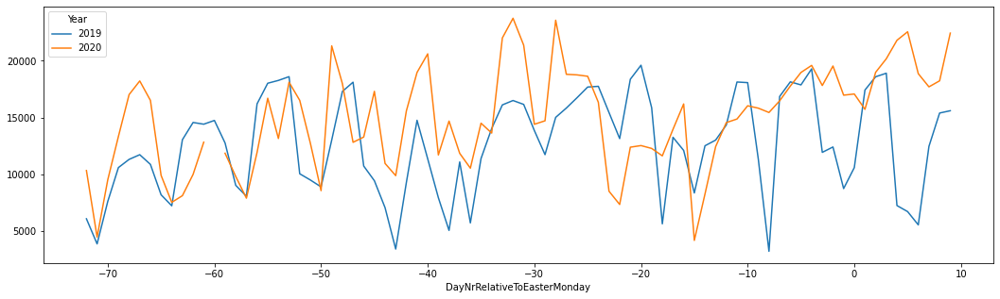

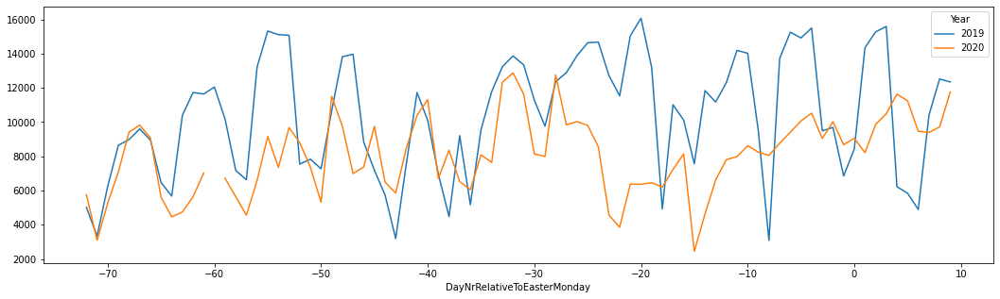

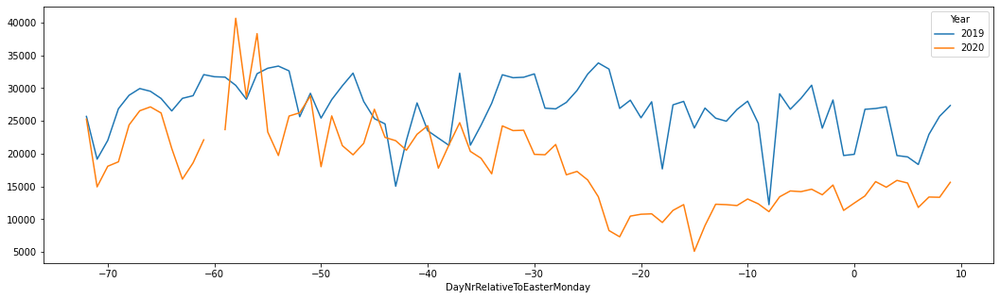

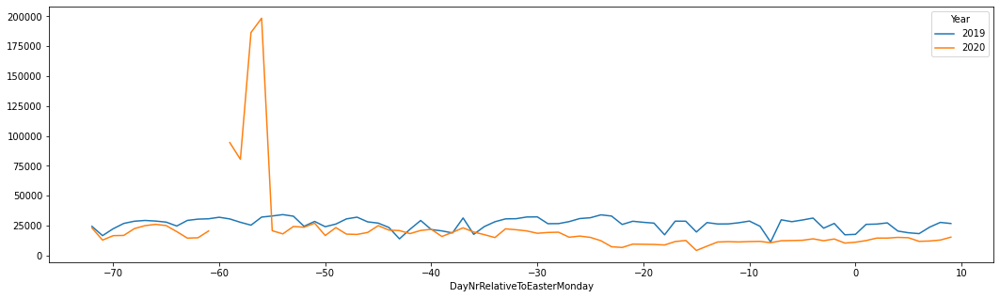

In [ ]:
pedestrianAndBike.groupby(['DayNrRelativeToEasterMonday','Year']).sum()['VELO_IN'].unstack().plot(figsize=(18,5))
pedestrianAndBike.groupby(['DayNrRelativeToEasterMonday','Year']).sum()['VELO_OUT'].unstack().plot(figsize=(18,5))
pedestrianAndBike.groupby(['DayNrRelativeToEasterMonday','Year']).sum()['FUSS_IN'].unstack().plot(figsize=(18,5))
pedestrianAndBike.groupby(['DayNrRelativeToEasterMonday','Year']).sum()['FUSS_OUT'].unstack().plot(figsize=(18,5))

Again outlier in FUSS_OUT is clearly visible and a missing day (-60) in 2020 can also be recognised.

### Summary plot for car data

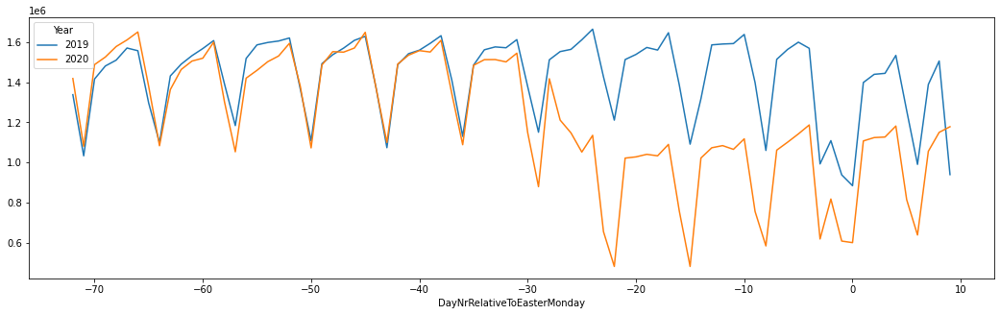

In [ ]:
cars.groupby(['DayNrRelativeToEasterMonday','Year']).sum()['AnzFahrzeuge'].unstack().plot(figsize=(18,5))

Data looks again very clean



### Enrich pedestrian and bike data with weather information

In [ ]:
bike_entries = len(bike_merged)
pedestrian_entries = len(pedestrian_merged)

print("Bike entries before enrichment:", bike_entries)
print("Pedestrian entries before enrichment:", pedestrian_entries)

bike_with_weather = pd.merge(bike_merged, weather, how="left", left_on=["DATUM"], right_on=["timestamp"])
pedestrian_with_weather = pd.merge(pedestrian_merged, weather, how="left", left_on=["DATUM"], right_on=["timestamp"])

bike = bike_with_weather.drop("timestamp", axis=1)
pedestrian = pedestrian_with_weather.drop("timestamp", axis=1)

print("Temperature missing in bike:", bike_with_weather["temperature"].isna().sum())
print("Temperature missing in pedestrian:", pedestrian_with_weather["temperature"].isna().sum())

Bike entries before enrichment: 323579
Pedestrian entries before enrichment: 246987
Temperature missing in bike: 0
Temperature missing in pedestrian: 0


### Check data quality for selected locations - bike data

As some locations only count VELO_IN just use this column for further analysis

In [ ]:
# check for na
bike['VELO_IN'].isna().sum()

0

In [ ]:
# remove entries with na - will be imputed later with missing entries
bike = bike.loc[bike['VELO_IN'].notna()]

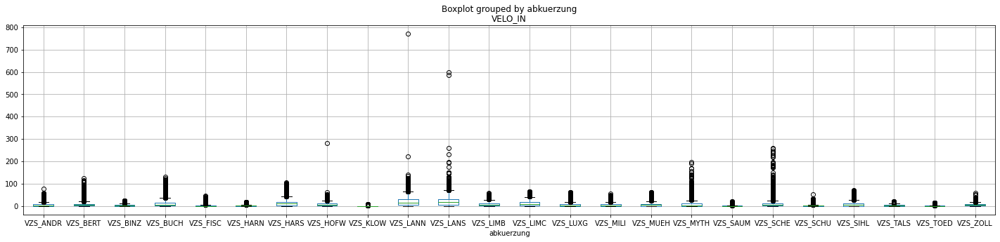

In [ ]:
# check boxplots
bike.boxplot(column='VELO_IN',by='abkuerzung', figsize=(24,5))

In [ ]:
# remove outliers
bike.loc[(bike['abkuerzung']=='VZS_HOFW') & (bike['VELO_IN']>200),'VELO_IN']=np.nan
bike.loc[(bike['abkuerzung']=='VZS_LANN') & (bike['VELO_IN']>200),'VELO_IN']=np.nan
bike.loc[(bike['abkuerzung']=='VZS_LANS') & (bike['VELO_IN']>200),'VELO_IN']=np.nan
bike = bike.loc[bike['VELO_IN'].notna()]


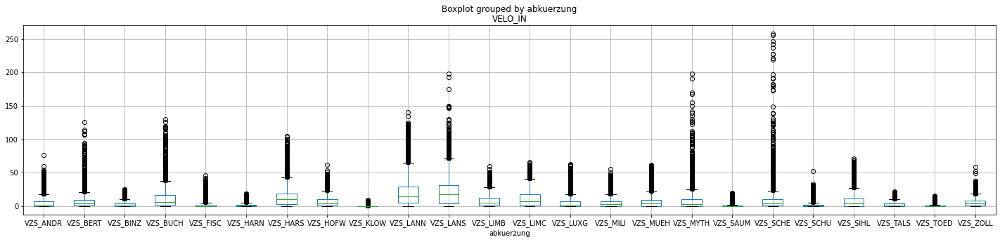

In [ ]:
# check again
bike.boxplot(column='VELO_IN',by='abkuerzung', figsize=(24,5))

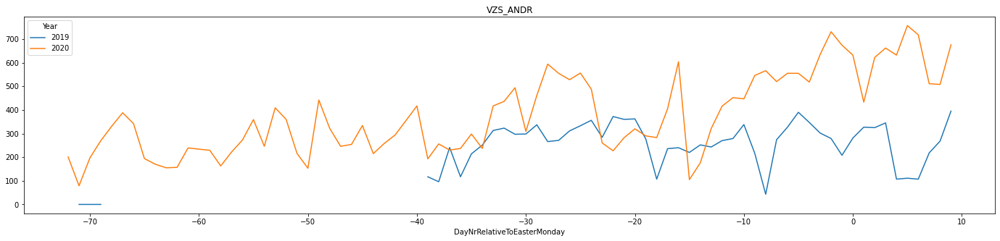

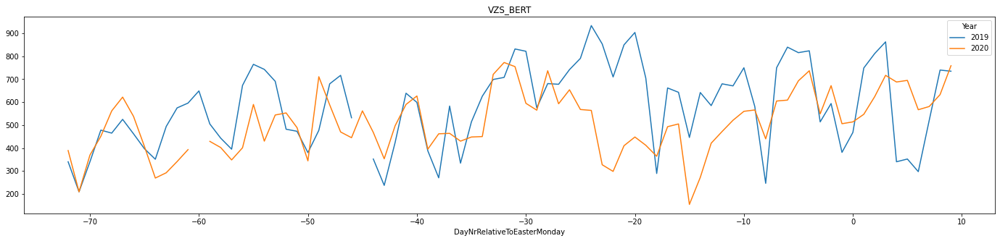

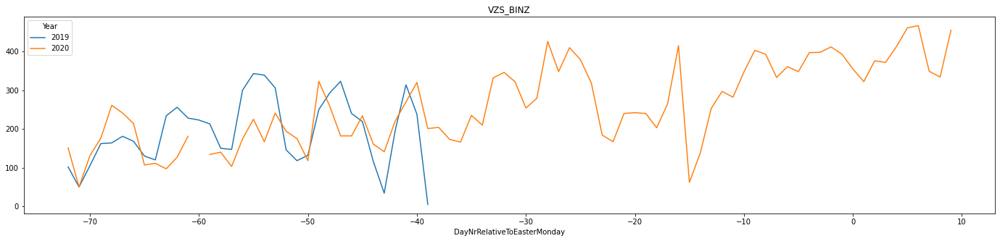

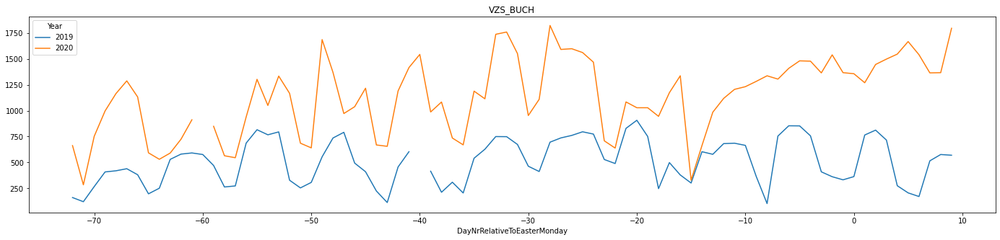

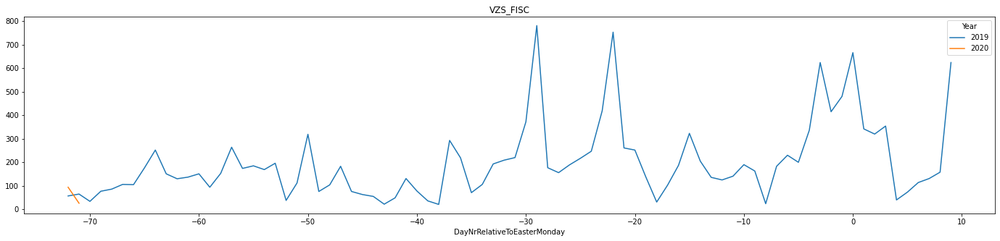

...

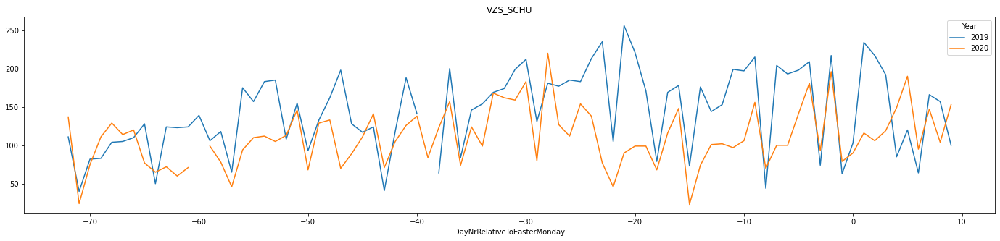

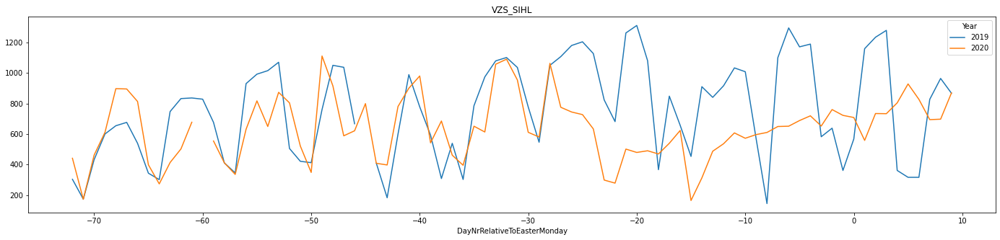

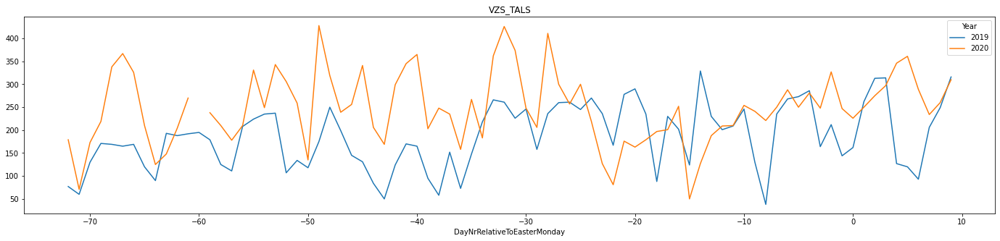

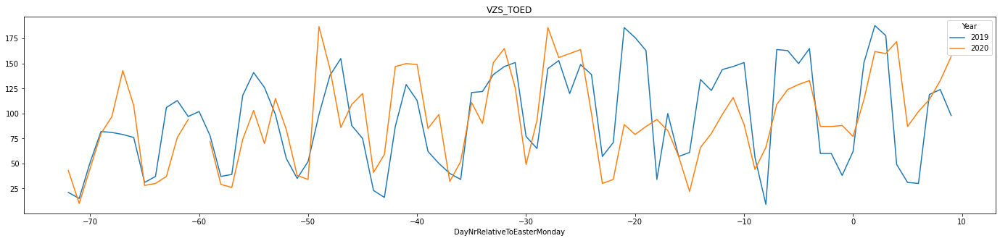

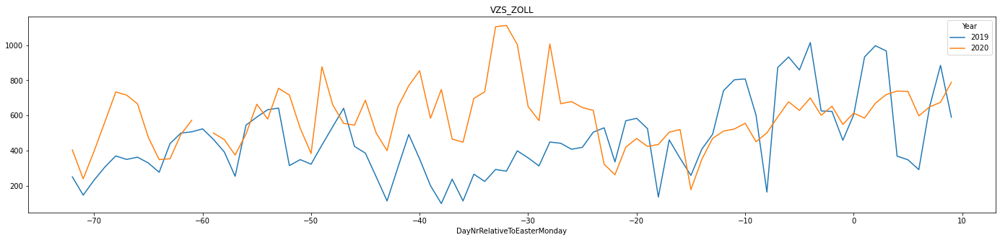

In [ ]:
for location, data in bike.groupby('abkuerzung'):
  data.groupby(['DayNrRelativeToEasterMonday','Year'])['VELO_IN'].sum().unstack().plot(figsize=(24,5), title=location)

In [ ]:
#drop locations with too many missing data and/or unreasonable scale between 2019 and 2020
bike.drop(bike.loc[bike['abkuerzung'].isin(['VZS_ANDR','VZS_SCHU','VZS_MYTH','VZS_BERT','VZS_BINZ','VZS_BUCH','VZS_FISC','VZS_HOFW','VZS_KLOW','VZS_LANN','VZS_LUXG','VZS_SAUM','VZS_SCHE'])].index, inplace=True)

In [ ]:
# check for missing time entries
# note completly missing days will be imputed on the aggregate level

numberofentriesperday = bike.groupby(['Date','abkuerzung'])['VELO_IN'].count().reset_index()
numberofentriesperday.loc[numberofentriesperday['VELO_IN'] != 96]

,Date,abkuerzung,VELO_IN
549,2019-03-31,VZS_HARN,92
550,2019-03-31,VZS_HARS,92
551,2019-03-31,VZS_LANS,92
552,2019-03-31,VZS_LIMB,92
553,2019-03-31,VZS_LIMC,92
554,2019-03-31,VZS_MILI,92
555,2019-03-31,VZS_MUEH,92
556,2019-03-31,VZS_SIHL,92
557,2019-03-31,VZS_TALS,92
558,2019-03-31,VZS_TOED,92


In [ ]:
for index, entry in numberofentriesperday.loc[numberofentriesperday['VELO_IN'] != 96].iterrows():
  day_data_of_location = bike.loc[(bike['Date'] == entry['Date']) & (bike['abkuerzung'] == entry['abkuerzung'])].copy()
  day_data_of_location.sort_values(by='DATUM', inplace=True)
  loc = entry['abkuerzung']
  d = entry['Date']
  previous = day_data_of_location.iloc[0]
  for hour in range(0, 24):
    for minutes in range(0, 60, 15):
      ts = datetime.datetime(d.year, d.month, d.day, hour, minutes, 0)
      entry = day_data_of_location[day_data_of_location["DATUM"] == ts]
      if entry.empty:
        print("Missing entry for:", ts, "and location: ",loc)
        new = previous.copy()
        new['Datum'] = ts
        new['Hour'] = new['Datum'].dt.hour
        bike = bike.append(new)
      else:
        previous = entry

Missing entry for: 2019-03-31 02:00:00 and location:  VZS_HARN
Missing entry for: 2019-03-31 02:15:00 and location:  VZS_HARN
Missing entry for: 2019-03-31 02:30:00 and location:  VZS_HARN
Missing entry for: 2019-03-31 02:45:00 and location:  VZS_HARN
Missing entry for: 2019-03-31 02:00:00 and location:  VZS_HARS
Missing entry for: 2019-03-31 02:15:00 and location:  VZS_HARS
Missing entry for: 2019-03-31 02:30:00 and location:  VZS_HARS
Missing entry for: 2019-03-31 02:45:00 and location:  VZS_HARS
Missing entry for: 2019-03-31 02:00:00 and location:  VZS_LANS
Missing entry for: 2019-03-31 02:15:00 and location:  VZS_LANS
Missing entry for: 2019-03-31 02:30:00 and location:  VZS_LANS
Missing entry for: 2019-03-31 02:45:00 and location:  VZS_LANS
Missing entry for: 2019-03-31 02:00:00 and location:  VZS_LIMB
Missing entry for: 2019-03-31 02:15:00 and location:  VZS_LIMB
Missing entry for: 2019-03-31 02:30:00 and location:  VZS_LIMB
Missing entry for: 2019-03-31 02:45:00 and location:  V

In [ ]:
# check again

numberofentriesperday = bike.groupby(['Date','abkuerzung'])['VELO_IN'].count().reset_index()
numberofentriesperday.loc[numberofentriesperday['VELO_IN'] != 96]

,Date,abkuerzung,VELO_IN


All missing time data entries were imputed. Still some days data is missing, but this will be imputed later

### Check data quality for selected locations - pedestrian data

In [ ]:
#check for missing values
pedestrian[['FUSS_IN','FUSS_OUT']].isna().sum()

FUSS_IN     0
FUSS_OUT    0
dtype: int64

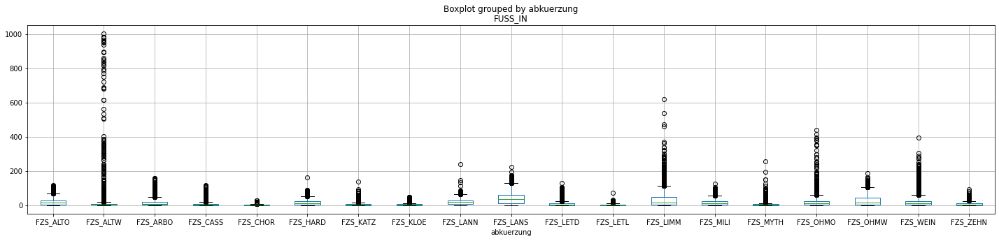

In [ ]:
#check distribution
pedestrian.boxplot(column='FUSS_IN',by='abkuerzung', figsize=(24,5))

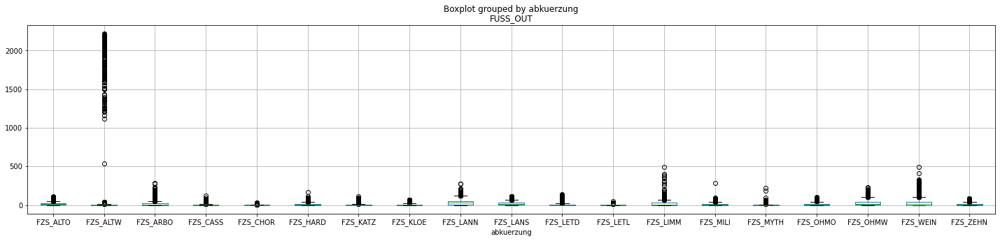

In [ ]:
pedestrian.boxplot(column='FUSS_OUT',by='abkuerzung', figsize=(24,5))

In [ ]:
#drop locations with unreasonable high counts
pedestrian.drop(pedestrian.loc[pedestrian['abkuerzung']=='FZS_ALTW'].index, inplace=True)

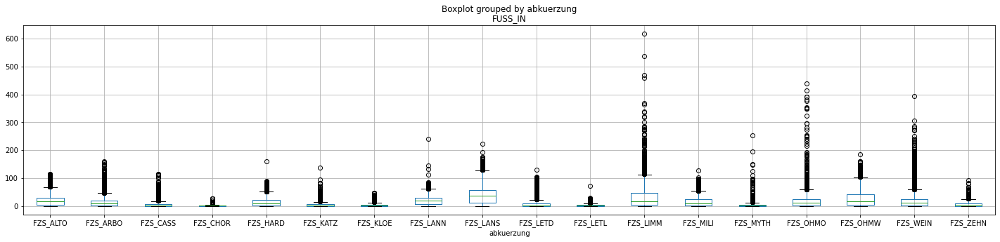

In [ ]:
#check again
pedestrian.boxplot(column='FUSS_IN',by='abkuerzung', figsize=(24,5))

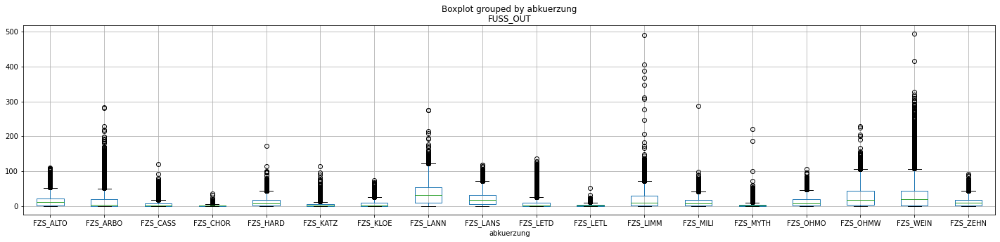

In [ ]:
#check again
pedestrian.boxplot(column='FUSS_OUT',by='abkuerzung', figsize=(24,5))

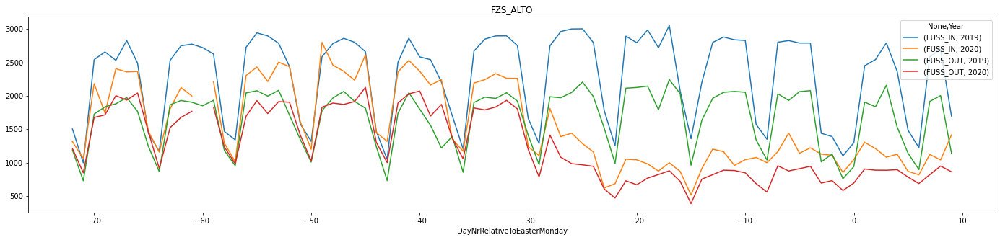

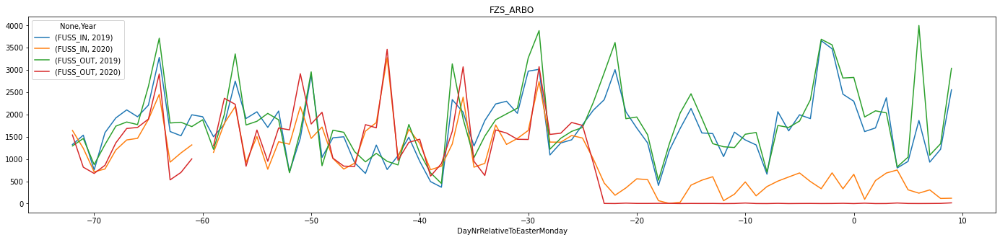

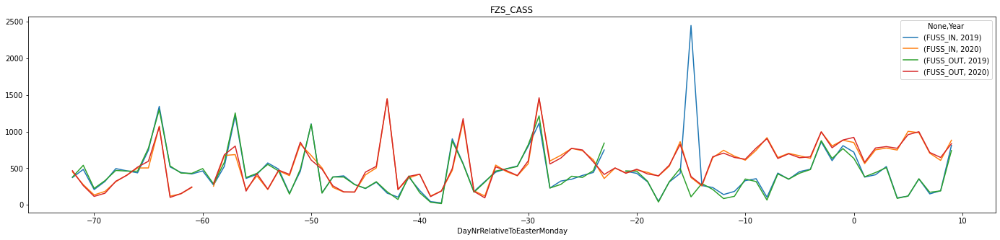

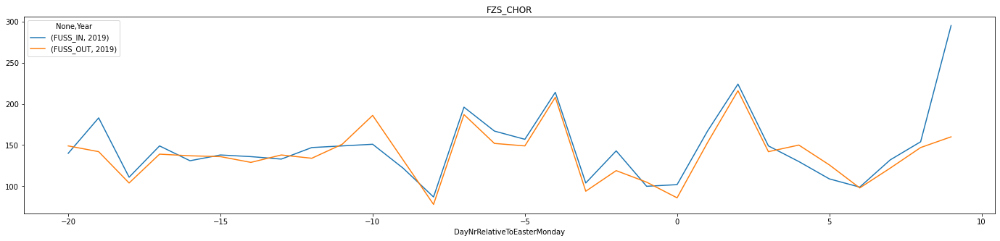

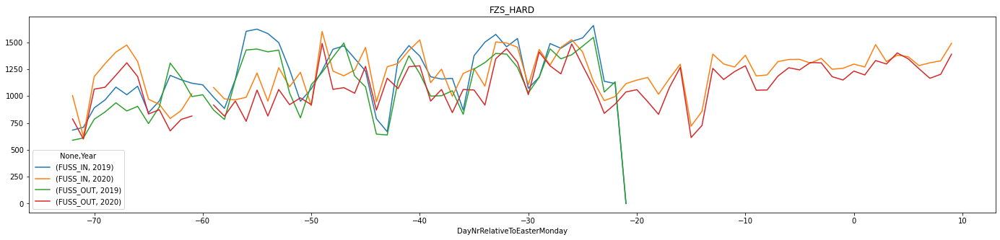

...

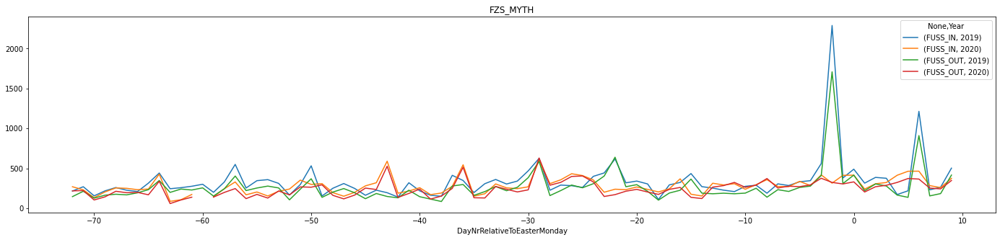

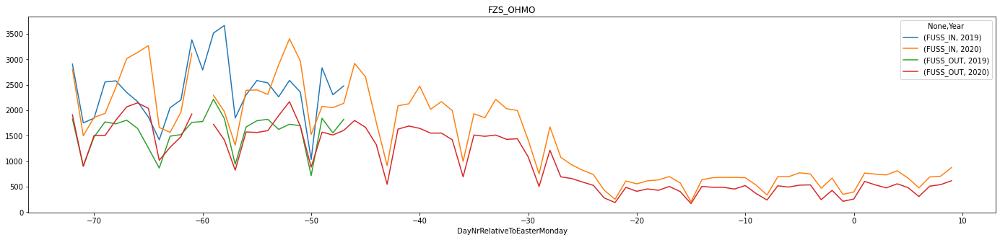

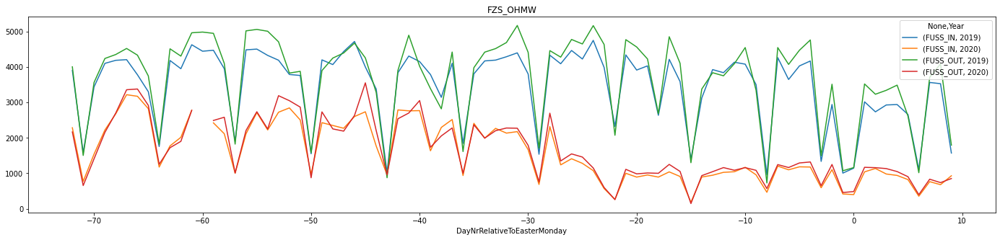

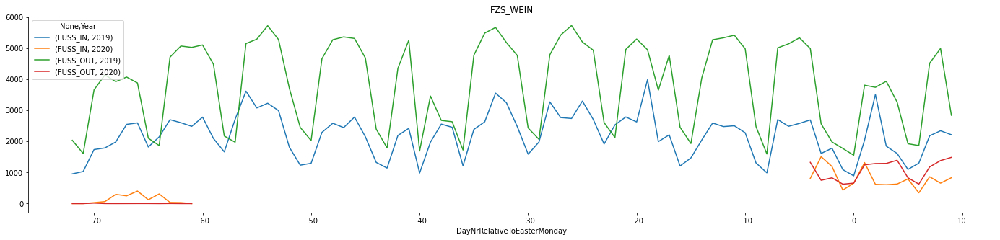

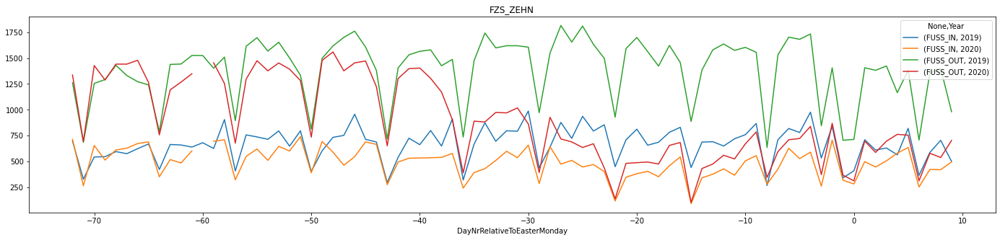

In [ ]:
for location, data in pedestrian.groupby('abkuerzung'):
  data.groupby(['DayNrRelativeToEasterMonday','Year'])['FUSS_IN','FUSS_OUT'].sum().unstack().plot(figsize=(24,5), title=location)

In [ ]:
#drop locations with too many missing data and/or unreasonable scale between 2019 and 2020
pedestrian.drop(pedestrian.loc[pedestrian['abkuerzung'].isin(['FZS_CASS','FZS_CHOR','FZS_HARD','FZS_KLOE','FZS_LETL','FZS_LETD','FZS_MYTH','FZS_OHMO','FZS_WEIN','FZS_OHMW'])].index, inplace=True)

In [ ]:
# check for missing entries
# note that some days are missing completely which will be imputed on aggregated data later
numberofentriesperdayped = pedestrian.groupby(['Date','abkuerzung'])[['FUSS_IN', 'FUSS_OUT']].count().reset_index()
numberofentriesperdayped.loc[(numberofentriesperdayped['FUSS_IN'] != 96) | (numberofentriesperdayped['FUSS_OUT'] != 96)]


,Date,abkuerzung,FUSS_IN,FUSS_OUT
400,2019-03-31,FZS_ALTO,92,92
401,2019-03-31,FZS_ARBO,92,92
402,2019-03-31,FZS_KATZ,92,92
403,2019-03-31,FZS_LANN,92,92
404,2019-03-31,FZS_LANS,92,92
405,2019-03-31,FZS_LIMM,92,92
406,2019-03-31,FZS_MILI,92,92
407,2019-03-31,FZS_ZEHN,92,92
1101,2020-03-29,FZS_ALTO,92,92
1102,2020-03-29,FZS_ARBO,92,92


In [ ]:
# Impute missing entries
for index, entry in numberofentriesperdayped.loc[numberofentriesperdayped['FUSS_IN'] != 96].iterrows():
  day_data_of_location = pedestrian.loc[(pedestrian['Date'] == entry['Date']) & (pedestrian['abkuerzung'] == entry['abkuerzung'])].copy()
  day_data_of_location.sort_values(by='DATUM', inplace=True)
  loc = entry['abkuerzung']
  d = entry['Date']
  previous = day_data_of_location.iloc[0]
  for hour in range(0, 24):
    for minutes in range(0, 60, 15):
      ts = datetime.datetime(d.year, d.month, d.day, hour, minutes, 0)
      entry = day_data_of_location[day_data_of_location["DATUM"] == ts]
      if entry.empty:
        print("Missing entry for:", ts, "and location: ",loc)
        new = previous.copy()
        new['Datum'] = ts
        new['Hour'] = new['Datum'].dt.hour
        pedestrian = pedestrian.append(new)
      else:
        previous = entry

Missing entry for: 2019-03-31 02:00:00 and location:  FZS_ALTO
Missing entry for: 2019-03-31 02:15:00 and location:  FZS_ALTO
Missing entry for: 2019-03-31 02:30:00 and location:  FZS_ALTO
Missing entry for: 2019-03-31 02:45:00 and location:  FZS_ALTO
Missing entry for: 2019-03-31 02:00:00 and location:  FZS_ARBO
Missing entry for: 2019-03-31 02:15:00 and location:  FZS_ARBO
Missing entry for: 2019-03-31 02:30:00 and location:  FZS_ARBO
Missing entry for: 2019-03-31 02:45:00 and location:  FZS_ARBO
Missing entry for: 2019-03-31 02:00:00 and location:  FZS_KATZ
Missing entry for: 2019-03-31 02:15:00 and location:  FZS_KATZ
Missing entry for: 2019-03-31 02:30:00 and location:  FZS_KATZ
Missing entry for: 2019-03-31 02:45:00 and location:  FZS_KATZ
Missing entry for: 2019-03-31 02:00:00 and location:  FZS_LANN
Missing entry for: 2019-03-31 02:15:00 and location:  FZS_LANN
Missing entry for: 2019-03-31 02:30:00 and location:  FZS_LANN
Missing entry for: 2019-03-31 02:45:00 and location:  F

In [ ]:
# check again
numberofentriesperdayped = pedestrian.groupby(['Date','abkuerzung'])[['FUSS_IN', 'FUSS_OUT']].count().reset_index()
numberofentriesperdayped.loc[(numberofentriesperdayped['FUSS_IN'] != 96) | (numberofentriesperdayped['FUSS_OUT'] != 96)]

,Date,abkuerzung,FUSS_IN,FUSS_OUT


All missing entries generated for days with data. Days that are completely missing will be imputed later on aggregated data

### Check Data quality - Car data

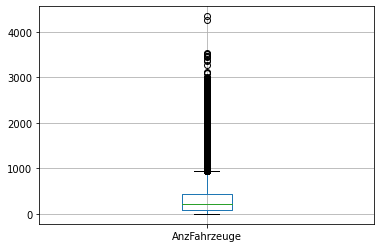

In [ ]:
cars.boxplot(column='AnzFahrzeuge')

Only consider locations where the correlation before the shutdown was high between 2019 and 2020. Also only consider locations where the euclidean distance was low (again between datapoints of 2020 and matching datapoints of 2019 relative to easter monday). Further drop all locations where not all days have values

In [ ]:
to_drop = []
for location, data in cars.groupby('Knummer'):
  firstdays = data.loc[data['DayNrRelativeToEasterMonday']< startday + 30].copy()
  firstdays['AnzFahrzeuge'] = (firstdays['AnzFahrzeuge']-firstdays['AnzFahrzeuge'].mean())/firstdays['AnzFahrzeuge'].std()
  years = firstdays.groupby(['DayNrRelativeToEasterMonday','Year'])['AnzFahrzeuge'].sum().unstack()
  if 2019 in firstdays['Year'].unique() and 2020 in firstdays['Year'].unique():
    if years.corr().iloc[0,1] > 0.8:
      if distance.euclidean(years.values[:,0],years.values[:,1]) > 30:
        to_drop.append(location)
    else:
      to_drop.append(location)
  else:
    to_drop.append(location)


  # missing values
  numberOfDays = data['DayNrRelativeToEasterMonday'].nunique()
  values = data.groupby(['DayNrRelativeToEasterMonday','Year'])['AnzFahrzeuge'].sum().unstack()
  if values.shape[0] != numberOfDays:
    to_drop.append(location)
  if values.isna().any().any():
    to_drop.append(location)

In [ ]:
# drop some more bad locations
to_drop.append(324)
to_drop.append(323)
to_drop.append(364)

for i in to_drop:
  cars = cars.loc[cars['Knummer'] != i].copy()

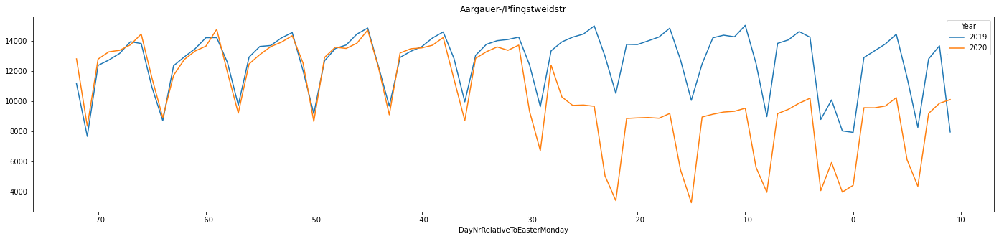

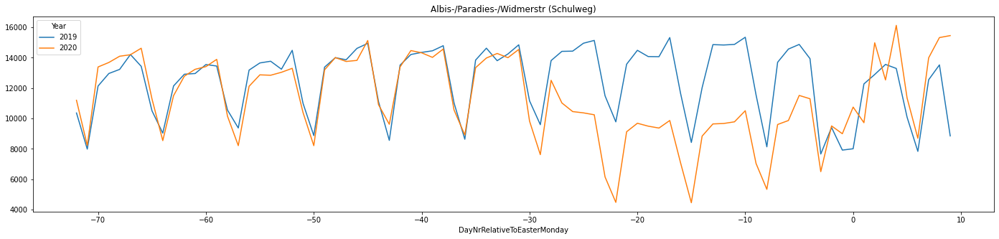

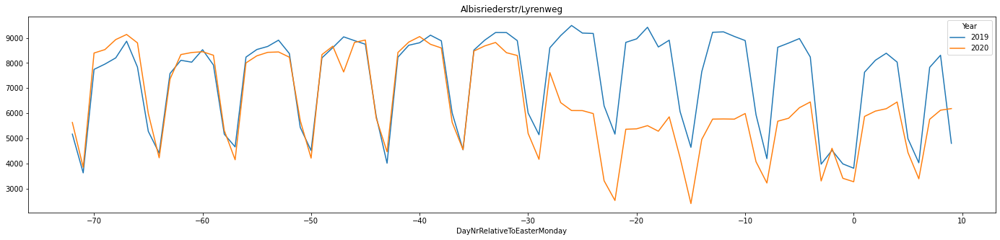

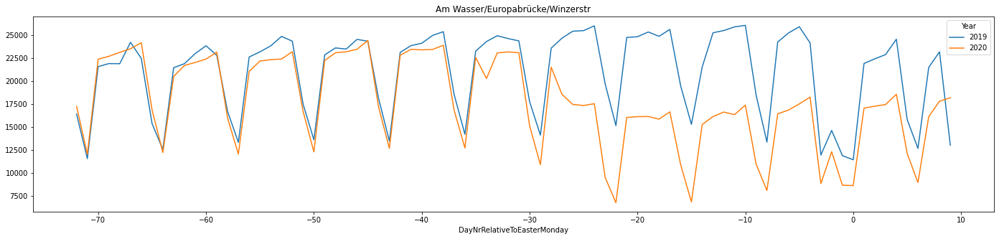

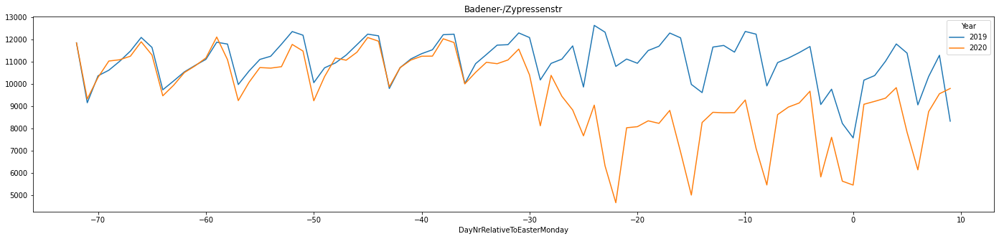

...

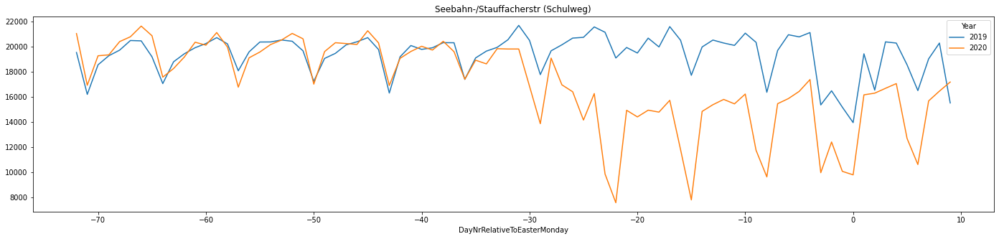

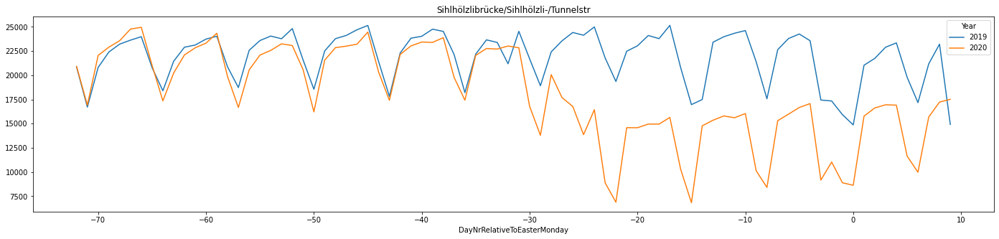

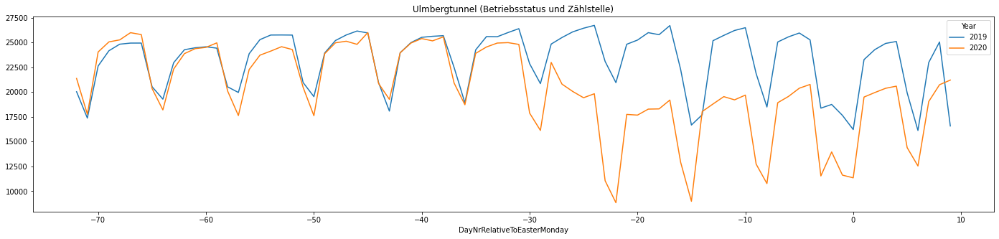

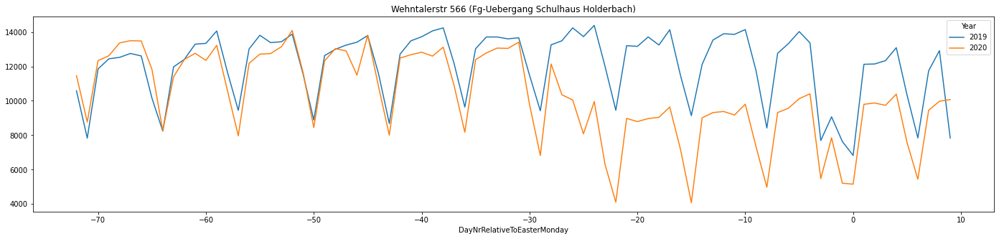

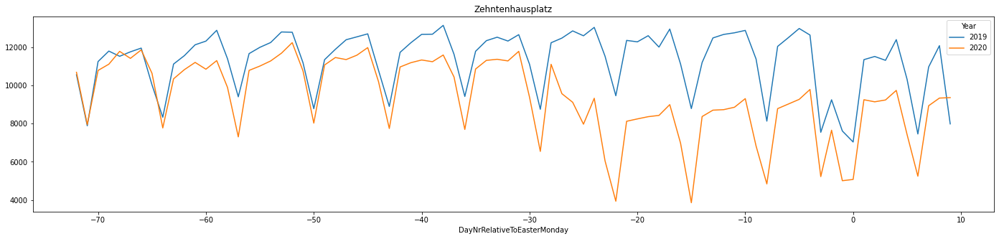

In [ ]:
for location, data in cars.groupby('Kname'):
  data.groupby(['DayNrRelativeToEasterMonday','Year'])['AnzFahrzeuge'].sum().unstack().plot(figsize=(24,5), title=location)

Cars now looks clean

### Aggregate on day level and impute missing days

In [ ]:
bike_final = bike.groupby(['Date','abkuerzung']).agg({
    'bezeichnung' : 'first',
    'Weekday': 'first',
    'Year': 'first',
    'DayNrRelativeToEasterMonday': 'first',
    'geometry': 'first',
    'VELO_IN': 'sum',
    'temperature': 'max',
    'humidity': 'mean',
})
bike_final = bike_final.reset_index(level=1).reset_index(level=0)

monday = {2019: easterMonday2019, 2020: easterMonday2020}

# find missing days
missing = bike_final.groupby(['DayNrRelativeToEasterMonday','abkuerzung','Year'])['VELO_IN'].sum().copy()
missing = missing.unstack()
missing = missing.reset_index()
for y in [2019,2020]:
  my = missing.loc[missing[y].isna()]
  for index, row in my.iterrows():
    daterow = bike_final.loc[bike_final['abkuerzung'] == row['abkuerzung']].iloc[0].copy()
    daterow['DayNrRelativeToEasterMonday'] = row['DayNrRelativeToEasterMonday']
    daterow['VELO_IN'] = np.nan
    daterow['temperature'] = np.nan
    daterow['humidity'] = np.nan
    daterow['Date'] = monday[y]+timedelta(days=daterow['DayNrRelativeToEasterMonday'])
    daterow['Year'] = y
    daterow['Weekday'] = daterow['Date'].weekday()
    bike_final = bike_final.append(daterow)

bike_final = bike_final.sort_values(['abkuerzung','Date'])
bike_final['VELO_IN'].interpolate(inplace=True)
bike_final['temperature'].interpolate(inplace=True)
bike_final['humidity'].interpolate(inplace=True)

In [ ]:
pedestrian_final = pedestrian.groupby(['Date','abkuerzung']).agg({
    'bezeichnung' : 'first',
    'Weekday': 'first',
    'Year': 'first',
    'DayNrRelativeToEasterMonday': 'first',
    'geometry': 'first',
    'FUSS_IN': 'sum',
    'FUSS_OUT': 'sum',
    'temperature': 'max',
    'humidity': 'mean',
})
pedestrian_final = pedestrian_final.reset_index(level=1).reset_index(level=0)
pedestrian_final.sort_values(['abkuerzung','Date'])
pedestrian_final['FUSS_IN'].interpolate(inplace=True)
pedestrian_final['FUSS_OUT'].interpolate(inplace=True)

# find missing days
missing = pedestrian_final.groupby(['DayNrRelativeToEasterMonday','abkuerzung','Year'])['FUSS_IN'].sum().copy()
missing = missing.unstack()
missing = missing.reset_index()
for y in [2019,2020]:
  my = missing.loc[missing[y].isna()]
  for index, row in my.iterrows():
    daterow = pedestrian_final.loc[pedestrian_final['abkuerzung'] == row['abkuerzung']].iloc[0].copy()
    daterow['DayNrRelativeToEasterMonday'] = row['DayNrRelativeToEasterMonday']
    daterow['FUSS_IN'] = np.nan
    daterow['FUSS_OUT'] = np.nan
    daterow['temperature'] = np.nan
    daterow['humidity'] = np.nan
    daterow['Date'] = monday[y]+timedelta(days=daterow['DayNrRelativeToEasterMonday'])
    daterow['Year'] = y
    daterow['Weekday'] = daterow['Date'].weekday()
    pedestrian_final = pedestrian_final.append(daterow)

pedestrian_final.sort_values(['abkuerzung','Date'])
pedestrian_final['FUSS_IN'].interpolate(inplace=True)
pedestrian_final['FUSS_OUT'].interpolate(inplace=True)
pedestrian_final['temperature'].interpolate(inplace=True)
pedestrian_final['humidity'].interpolate(inplace=True)

In [ ]:
car_final = cars.groupby(['Date','Knummer']).agg({
    'Kname': 'first',
    'Weekday': 'first',
    'Year': 'first',
    'DayNrRelativeToEasterMonday': 'first',
    'EKoord': 'first',
    'NKoord': 'first',
    'AnzFahrzeuge': 'sum'
})
car_final.loc[car_final['AnzFahrzeuge']==0] = np.nan
car_final = car_final.reset_index(level=1).reset_index(level=0)
car_final = car_final.sort_values(by=['Knummer','Date'])
car_final['AnzFahrzeuge'].interpolate(inplace=True)

### Information on data format for further processing

All data is aggregated by day and location

In [ ]:
#Description of the data

#abkuerzung: index of the location where the traffic was measured
#bezeichnung: name of the location
#Weekday: number of weekday
#geometry: geo position (note there might be more than one position for each location because of sensor replacement)
#VELO_IN: count of bikes passing by
#temperature: max temperature of that day
#humidity: mean humidity in that day


#For bikes only 'IN' measure is concidered because some locations only count 'IN'

# note that this data can only be interpreted for each location on its own. For comparison and aggregation the data would need to be scaled as described in 
# https://data.stadt-zuerich.ch/dataset/83ca481f-275c-417b-9598-3902c481e400/resource/f5d31b06-98df-44da-90cb-daf570ba84b1/download/2018_02_19_korrekturfaktoren_vzs_ogd_veloverkehr.pdf
bike_final.columns

Index(['Date', 'abkuerzung', 'bezeichnung', 'Weekday', 'Year',
       'DayNrRelativeToEasterMonday', 'geometry', 'VELO_IN', 'temperature',
       'humidity'],
      dtype='object')

In [ ]:
#Pedestrian has the same format as bike except the actual measures
#FUSS_IN: oneway count
#FUSS_OUT: otherway count

# note that this data can only be interpreted for each location on its own. For comparison and aggregation the data would need to be scaled as described in 
# https://data.stadt-zuerich.ch/dataset/83ca481f-275c-417b-9598-3902c481e400/resource/f5d31b06-98df-44da-90cb-daf570ba84b1/download/2018_02_19_korrekturfaktoren_vzs_ogd_veloverkehr.pdf

pedestrian_final.columns

Index(['Date', 'abkuerzung', 'bezeichnung', 'Weekday', 'Year',
       'DayNrRelativeToEasterMonday', 'geometry', 'FUSS_IN', 'FUSS_OUT',
       'temperature', 'humidity'],
      dtype='object')

In [ ]:
#Knummer: number of the location
#Kname: name of the location
#Weekday: number of weekday
#NKoord: Geo coordinate
#EKoord: Geo coordinate
#AnzFahrzuege: number of cars (daily)
car_final.columns

Index(['Date', 'Knummer', 'Kname', 'Weekday', 'Year',
       'DayNrRelativeToEasterMonday', 'EKoord', 'NKoord', 'AnzFahrzeuge'],
      dtype='object')

Example usage

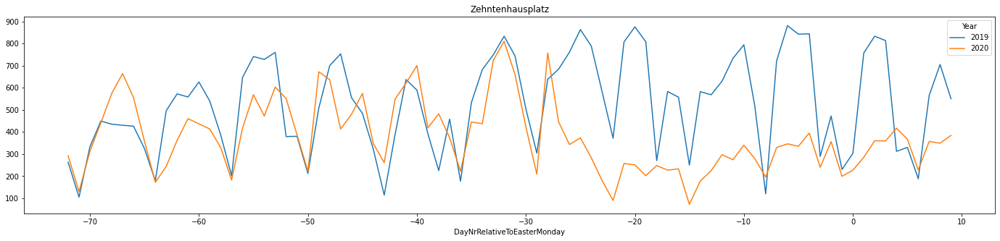

In [ ]:
bike_final.loc[bike_final['abkuerzung']=='VZS_MILI'].groupby(['DayNrRelativeToEasterMonday','Year'])['VELO_IN'].sum().unstack().plot(figsize=(24,5), title=location)

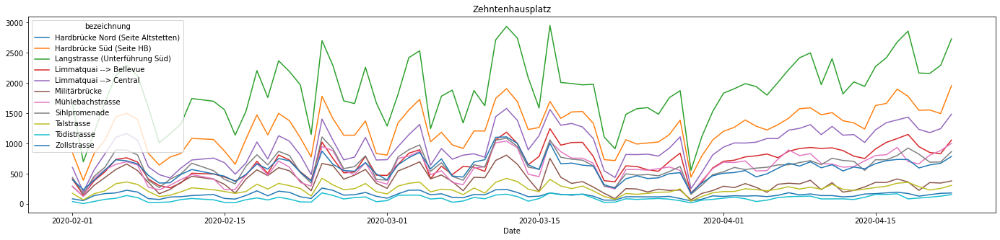

In [ ]:
bike_final.loc[bike_final['Year']==2020].groupby(['Date','bezeichnung'])['VELO_IN'].sum().unstack().plot(figsize=(24,5), title=location)

# 4. Statistical Models

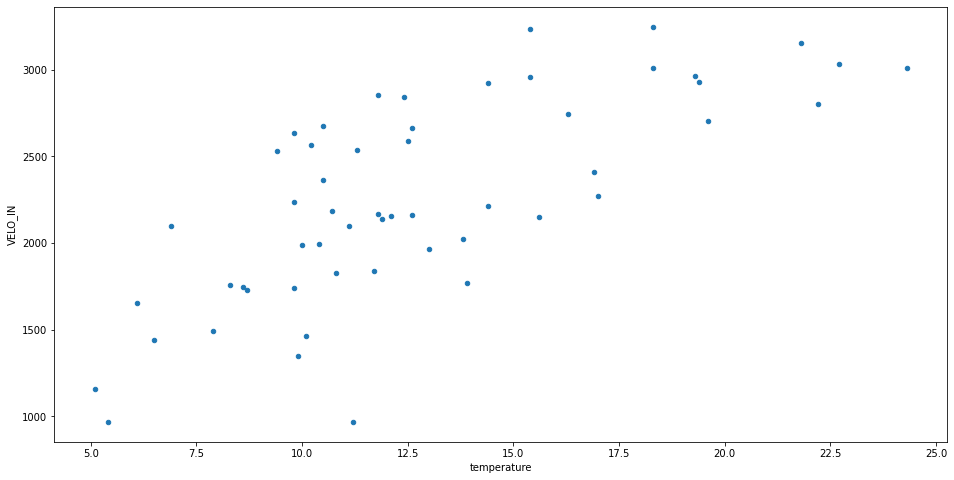

In [ ]:
b = bike_final

b = b[b["Year"] == 2019]
b = b[b["Weekday"] < 5]  # Weekdays start with 0
b = b[b["VELO_IN"]<4000]
b = b[b["abkuerzung"].isin(["VZS_LANS"])]
b = b[b['DayNrRelativeToEasterMonday'] != 0]  # 22.4.2019  easter monday
b = b[b['DayNrRelativeToEasterMonday'] != -3]  # 19.4.2019  good friday
b.plot(kind="scatter", x="temperature", y="VELO_IN", figsize=(16, 8))

### Linear Regression
Predicting the number of bike rides at Langstrasse based on the temperature in the year 2019 and 2020. Additionally, the number of bike rides for 2020 was predicted based on the model of 2019. The aim was to find the number of rides which would have happend without the Covid-19 outbreak.

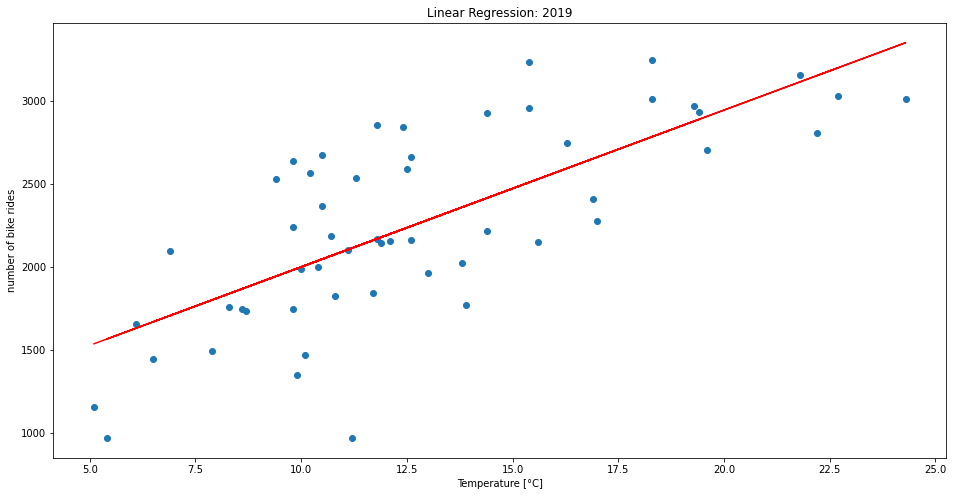

Function for linear regression in 2019
 y = 94.58285383734355 * x + 1053.2406983462597


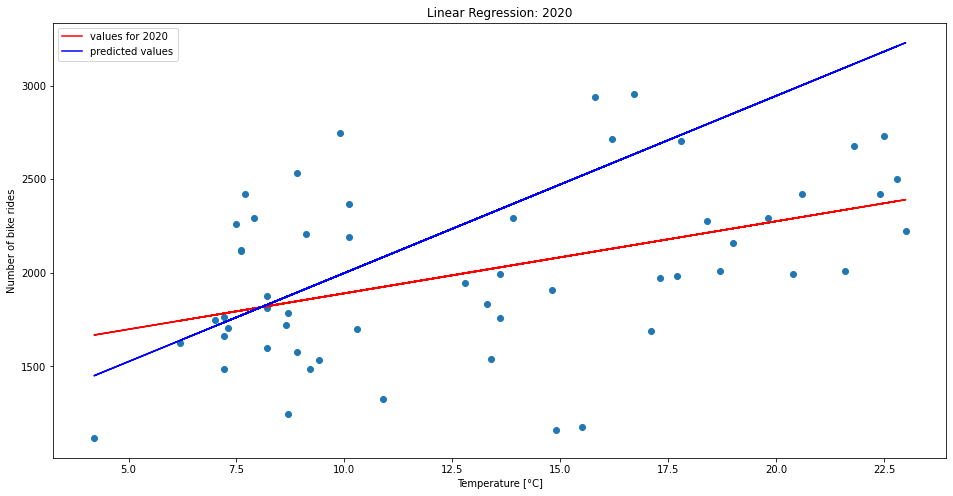

In [ ]:
#read in data for 2019
b = bike_final

b = b[b["Year"] == 2019]
b = b[b["Weekday"] < 5]  # Weekdays start with 0
b = b[b["VELO_IN"]<4000]
b = b[b["abkuerzung"].isin(["VZS_LANS"])]
b = b[b['DayNrRelativeToEasterMonday'] != 0]  # 22.4.2019  easter monday
b = b[b['DayNrRelativeToEasterMonday'] != -3]  # 19.4.2019  good friday

#data = pd.read_csv('data.csv')  # load data set
X = np.array(b["temperature"]).reshape((-1,1))  # values converts it into a numpy array
Y = np.array(b["VELO_IN"]).reshape((-1, 1))  # -1 means that calculate the dimension of rows, but have 1 column
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)  # make predictions

#create a plot for 2019
plt.figure(figsize=(16,8))
plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red')
plt.xlabel("Temperature [°C]")
plt.ylabel("number of bike rides")
plt.title("Linear Regression: 2019")
plt.show()

# get parameters for regression of 2019
print("Function for linear regression in 2019") 
m = linear_regressor.coef_[0]
m=m[0]
b = linear_regressor.intercept_
b=b[0]
print(' y = {0} * x + {1}'.format(m, b))

# read in data for 2020
bb = bike_final

bb = bb[bb["Year"] == 2020]
bb = bb[bb["Weekday"] < 5]  # Weekdays start with 0
bb = bb[bb["VELO_IN"]<4000]
bb = bb[bb["abkuerzung"].isin(["VZS_LANS"])]
bb = bb[bb['DayNrRelativeToEasterMonday'] != 0]  # 22.4.2019  easter monday
bb = bb[bb['DayNrRelativeToEasterMonday'] != -3]  # 19.4.2019  good friday


#data = pd.read_csv('data.csv')  # load data set
X = np.array(bb["temperature"]).reshape((-1,1)) 
Y = np.array(bb["VELO_IN"]).reshape((-1, 1))  
linear_regressor = LinearRegression()  # create object for the class
linear_regressor.fit(X, Y)  # perform linear regression
Y_pred = linear_regressor.predict(X)  # make predictions

#define regression line based on equation of 2019
regline=m*X+b

#create a plot for 2020
plt.figure(figsize=(16,8))
plt.scatter(X, Y)
plt.plot(X, Y_pred, color='red', label="values for 2020")
plt.plot(X, regline, color='blue', label="predicted values")
plt.xlabel("Temperature [°C]")
plt.ylabel("Number of bike rides")
plt.title("Linear Regression: 2020")
plt.legend()
plt.show()

### Multivariate Regression
A multivariate Regression including both temperature as well as humidity in the model.

#### Bike Example

In [ ]:
#read in data for 2019
b = bike_final

b = b[b["Year"] == 2019]
b = pd.concat([b,pd.get_dummies(b['Weekday'], drop_first=True)], axis=1)
b['special_day'] = b['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
b = b[b["abkuerzung"].isin(["VZS_LANS"])]

# run the regression: predict number of rides based on temperature and humidity
X = b[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
y = b["VELO_IN"]
multimodel = sm.OLS(y, X).fit()
multimodel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                VELO_IN   R-squared (uncentered):                   0.942
Model:                            OLS   Adj. R-squared (uncentered):              0.935
Method:                 Least Squares   F-statistic:                              132.4
Date:                Fri, 05 Jun 2020   Prob (F-statistic):                    1.58e-41
Time:                        19:58:53   Log-Likelihood:                         -630.49
No. Observations:                  82   AIC:                                      1279.
Df Residuals:                      73   BIC:                                      1301.
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
temperature   102.3099     11.763      8.698      0.000      78.867     125.753
humidity       10.3700      2.552      4.063      0.000       5.283      15.457
1             392.4029    234.132      1.676      0.098     -74.221     859.027
2             327.8358    237.177      1.382      0.171    -144.857     800.529
3             395.6310    238.372      1.660      0.101     -79.443     870.705
4             201.1828    237.974      0.845      0.401    -273.100     675.465
5            -287.3167    236.172     -1.217      0.228    -758.007     183.374
6           -1003.1168    235.192     -4.265      0.000   -1471.853    -534.380
special_day -1512.6242    447.428     -3.381      0.001   -2404.346    -620.902
==============================================================================
Omnibus:                       25.608   Durbin-Watson:                   0.952
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               53.457
Skew:                           1.101   Prob(JB):                     2.47e-12
Kurtosis:                       6.286   Cond. No.                         565.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

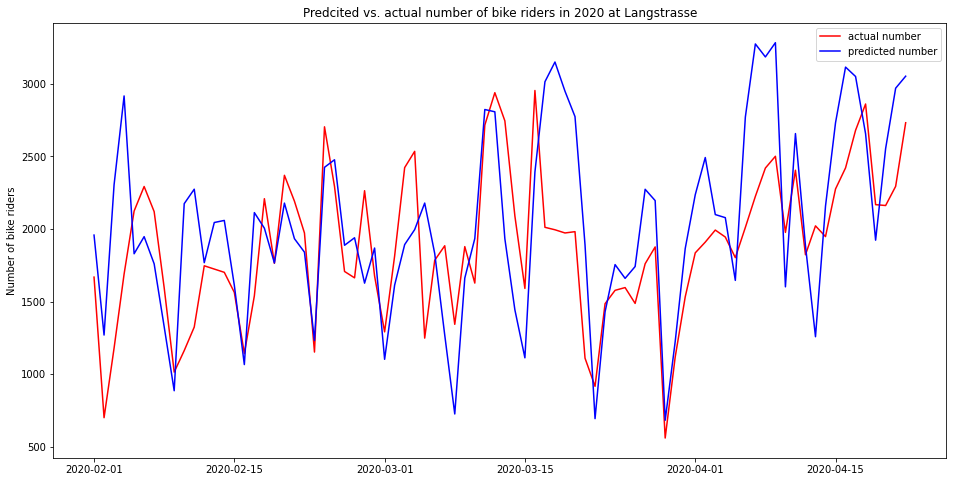

In [ ]:
bbb = bike_final

bbb = bbb[bbb["Year"] == 2020]
#bbb = bbb[bbb["DayNrRelativeToEasterMonday"] > -45]
bbb = pd.concat([bbb,pd.get_dummies(bbb['Weekday'], drop_first=True)], axis=1)
bbb['special_day'] = bbb['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
bbb = bbb[bbb["abkuerzung"].isin(["VZS_LANS"])]

#predict the number of bike rides at Langstrasse based on model of 2019 with humidity & temperature data of 2020
XXX = bbb[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
bbb["VELO_IN_predicted"]= multimodel.predict(XXX)
bbb = bbb.sort_values(by='Date')

actual = bike_final[bike_final["Year"] == 2020]
actual = actual[actual["abkuerzung"].isin(["VZS_LANS"])]
actual = actual.sort_values(by='Date')

#create a plot for 2020
plt.figure(figsize=(16,8))
plt.plot(actual["Date"], actual["VELO_IN"], color='red', label="actual number")
plt.plot(bbb["Date"], bbb["VELO_IN_predicted"], color='blue', label="predicted number")
plt.title("Predcited vs. actual number of bike riders in 2020 at Langstrasse")
plt.ylabel('Number of bike riders')
plt.legend()
plt.show()

#### Pedestrian Example

In [ ]:
#read in data for 2019
p = pedestrian_final

p = p[p["Year"] == 2019]
p = pd.concat([p,pd.get_dummies(p['Weekday'], drop_first=True)], axis=1)
p['special_day'] = p['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
p = p[p["abkuerzung"].isin(["FZS_MILI"])]

# run the regression: predict number of rides based on temperature and humidity
X = p[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
y = p["FUSS_IN"]
multimodel = sm.OLS(y, X).fit()
#predictions for the year 2019
multimodel.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                FUSS_IN   R-squared (uncentered):                   0.973
Model:                            OLS   Adj. R-squared (uncentered):              0.969
Method:                 Least Squares   F-statistic:                              289.5
Date:                Fri, 05 Jun 2020   Prob (F-statistic):                    2.21e-53
Time:                        19:58:53   Log-Likelihood:                         -581.45
No. Observations:                  82   AIC:                                      1181.
Df Residuals:                      73   BIC:                                      1203.
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
temperature    63.2685      6.468      9.782      0.000      50.378      76.160
humidity       12.5045      1.403      8.911      0.000       9.708      15.301
1             282.6007    128.741      2.195      0.031      26.021     539.181
2             267.3767    130.415      2.050      0.044       7.459     527.294
3             274.0411    131.073      2.091      0.040      12.813     535.269
4             193.3408    130.853      1.478      0.144     -67.450     454.131
5            -139.5896    129.863     -1.075      0.286    -398.406     119.227
6            -912.8182    129.324     -7.058      0.000   -1170.560    -655.076
special_day -1233.2813    246.030     -5.013      0.000   -1723.618    -742.944
==============================================================================
Omnibus:                        0.861   Durbin-Watson:                   0.913
Prob(Omnibus):                  0.650   Jarque-Bera (JB):                0.854
Skew:                          -0.021   Prob(JB):                        0.652
Kurtosis:                       2.502   Cond. No.                         565.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

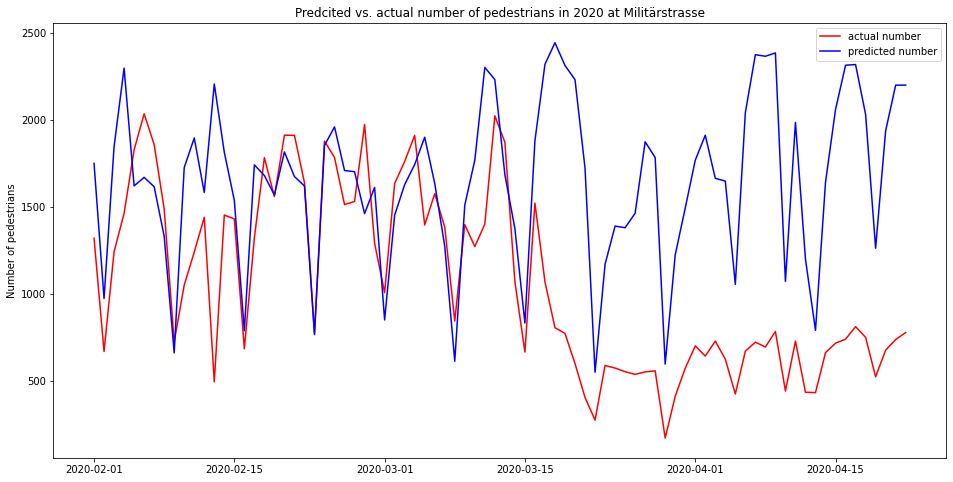

In [ ]:
ppp = pedestrian_final

ppp = ppp[ppp["Year"] == 2020]
#ppp = ppp[ppp["DayNrRelativeToEasterMonday"] > -45]
ppp = pd.concat([ppp,pd.get_dummies(ppp['Weekday'], drop_first=True)], axis=1)
ppp['special_day'] = ppp['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
ppp = ppp[ppp["abkuerzung"].isin(["FZS_MILI"])]


#predict the number of bike rides at Langstrasse based on model of 2019 with humidity & temperature data of 2020
XXX = ppp[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
ppp["FUSS_IN_predicted"]= multimodel.predict(XXX)
ppp = ppp.sort_values(by='Date')

actual = pedestrian_final[pedestrian_final["Year"] == 2020]
actual = actual[actual["abkuerzung"].isin(["FZS_MILI"])]
actual = actual.sort_values(by='Date')

#create a plot for 2020
plt.figure(figsize=(16,8))
plt.plot(actual["Date"], actual["FUSS_IN"], color='red', label="actual number")
plt.plot(ppp["Date"], ppp["FUSS_IN_predicted"], color='blue', label="predicted number")
plt.title("Predcited vs. actual number of pedestrians in 2020 at Militärstrasse")
plt.ylabel('Number of pedestrians')
plt.legend()
plt.show()

# 5. Visualization

## Prepare data for Visualization

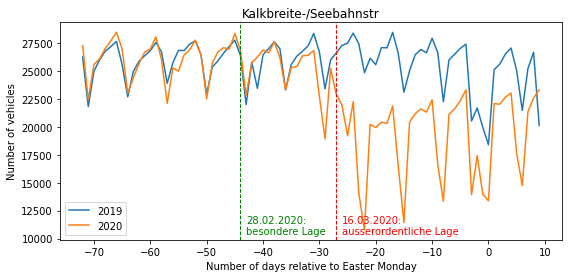

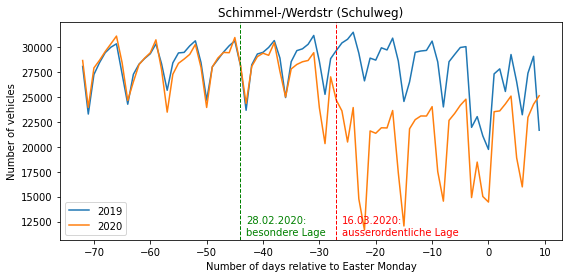

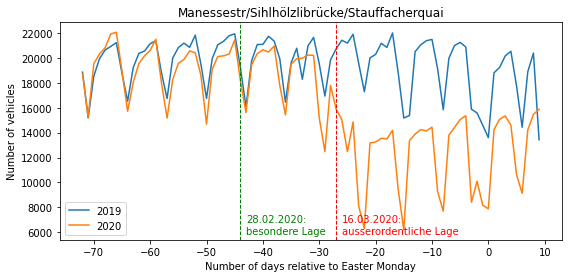

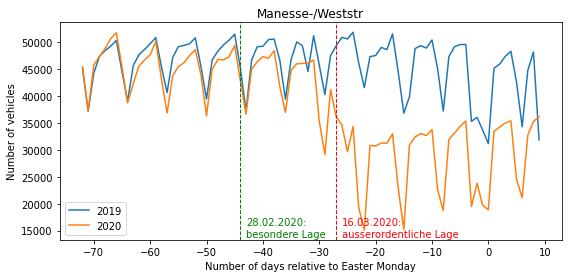

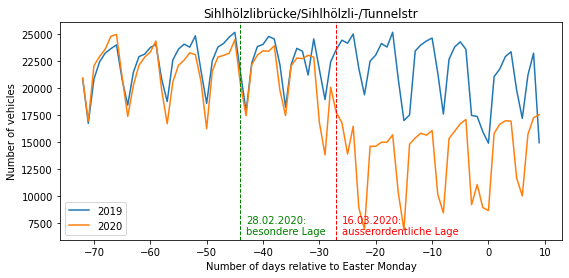

...

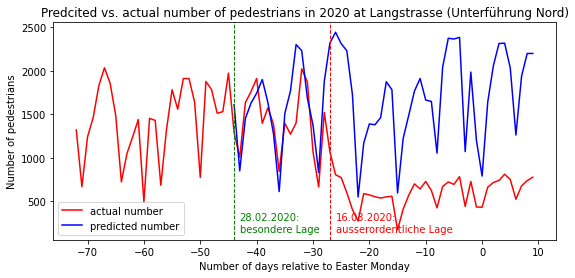

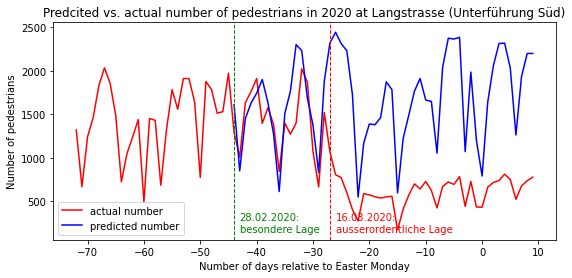

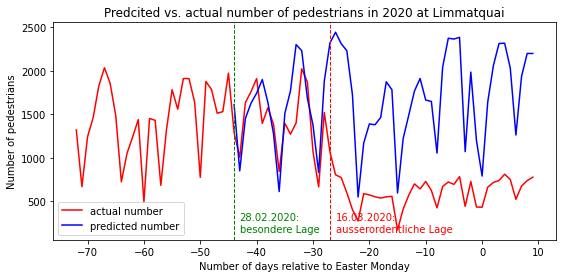

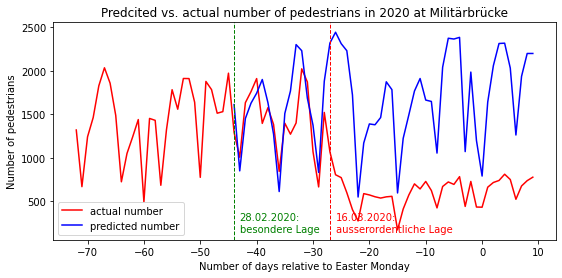

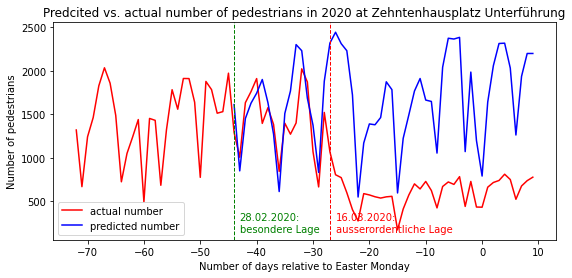

In [ ]:

#prepare graphs for car data
for knummer, data in cars.groupby('Knummer'):
  location = data['Kname'].iloc[0]
  data.groupby(['DayNrRelativeToEasterMonday','Year'])['AnzFahrzeuge'].sum().unstack().plot(figsize=(9,4), title=location)

  y_offset = data.groupby(['DayNrRelativeToEasterMonday','Year'])['AnzFahrzeuge'].sum().min() + 380
  
  plt.axvline(-44, color='g', linestyle='--', lw=1) #besondere Lage
  plt.text(-43, y_offset, '28.02.2020:\nbesondere Lage', color ='g', va='center')
  plt.axvline(-27, color='r', linestyle='--', lw=1) #ausserordentliche Lage
  plt.text(-26, y_offset, '16.03.2020:\nausserordentliche Lage', color = 'r', va = 'center') #pol[x].max() is for placing text field at the top of the graph
  plt.ylabel('Number of vehicles')
  plt.xlabel('Number of days relative to Easter Monday')
  plt.legend(loc=3)
  #save the figures to use them for the marker popups
  plt.savefig('car_'+str(knummer)+'.png')


#prepare graphs for bike data
for abk, data in bike.groupby('abkuerzung'):
  location = data['bezeichnung'].iloc[0]
  #regression
  b = bike_final
  b = b[b["Year"] == 2019]
  b = pd.concat([b,pd.get_dummies(b['Weekday'], drop_first=True)], axis=1)
  b['special_day'] = b['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
  b = b[b["abkuerzung"].isin(["VZS_LANS"])]
  X = b[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
  y = b["VELO_IN"]
  multimodel = sm.OLS(y, X).fit()
  #predict and plot
  bbb = bike_final
  bbb = bbb[bbb["Year"] == 2020]
  bbb = bbb[bbb["DayNrRelativeToEasterMonday"] > -45]
  bbb = pd.concat([bbb,pd.get_dummies(bbb['Weekday'], drop_first=True)], axis=1)
  bbb['special_day'] = bbb['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
  bbb = bbb[bbb["abkuerzung"].isin(["VZS_LANS"])]

  #predict the number of bike rides at Langstrasse based on model of 2019 with humidity & temperature data of 2020
  XXX = bbb[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
  bbb["VELO_IN_predicted"]= multimodel.predict(XXX)
  bbb = bbb.sort_values(by='Date')

  actual = bike_final[bike_final["Year"] == 2020]
  actual = actual[actual["abkuerzung"].isin(["VZS_LANS"])]
  actual = actual.sort_values(by='Date')

  y_offset = 650

  #create a plot for 2020
  plt.figure(figsize=(9,4))
  plt.plot(actual["DayNrRelativeToEasterMonday"], actual["VELO_IN"], color='red', label="actual number")
  plt.plot(bbb["DayNrRelativeToEasterMonday"], bbb["VELO_IN_predicted"], color='blue', label="predicted number")
  plt.title("Predcited vs. actual number of bike riders in 2020 at "+location)
  plt.legend()
  plt.axvline(-44, color='g', linestyle='--', lw=1) #besondere Lage
  plt.text(-43, y_offset, '28.02.2020:\nbesondere Lage', color ='g', va='center')
  plt.axvline(-27, color='r', linestyle='--', lw=1) #ausserordentliche Lage
  plt.text(-26, y_offset, '16.03.2020:\nausserordentliche Lage', color = 'r', va = 'center') #pol[x].max() is for placing text field at the top of the graph
  plt.ylabel('Number of bike riders')
  plt.xlabel('Number of days relative to Easter Monday')
  plt.legend(loc=3)
  #save the figures to use them for the marker popups
  plt.savefig('bike_'+str(abk)+'.png')

#prepare graphs for pedestrian data
for abk, data in pedestrian.groupby('abkuerzung'):
  location = data['bezeichnung'].iloc[0]
  #regression
  p = pedestrian_final
  p = p[p["Year"] == 2019]
  p = pd.concat([p,pd.get_dummies(p['Weekday'], drop_first=True)], axis=1)
  p['special_day'] = p['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
  p = p[p["abkuerzung"].isin(["FZS_MILI"])]
  X = p[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
  y = p["FUSS_IN"]
  multimodel = sm.OLS(y, X).fit()
  #predict and plot
  ppp = pedestrian_final
  ppp = ppp[ppp["Year"] == 2020]
  ppp = ppp[ppp["DayNrRelativeToEasterMonday"] > -45]
  ppp = pd.concat([ppp,pd.get_dummies(ppp['Weekday'], drop_first=True)], axis=1)
  ppp['special_day'] = ppp['DayNrRelativeToEasterMonday'].isin([0,-3]).astype(int)
  ppp = ppp[ppp["abkuerzung"].isin(["FZS_MILI"])]
  #predict the number of bike rides at Langstrasse based on model of 2019 with humidity & temperature data of 2020
  XXX = ppp[["temperature", "humidity",1,2,3,4,5,6,"special_day"]]
  ppp["FUSS_IN_predicted"]= multimodel.predict(XXX)
  ppp = ppp.sort_values(by='Date')

  actual = pedestrian_final[pedestrian_final["Year"] == 2020]
  actual = actual[actual["abkuerzung"].isin(["FZS_MILI"])]
  actual = actual.sort_values(by='Date')

  y_offset = 250

  #create a plot for 2020
  plt.figure(figsize=(9,4))
  plt.plot(actual["DayNrRelativeToEasterMonday"], actual["FUSS_IN"], color='red', label="actual number")
  plt.plot(ppp["DayNrRelativeToEasterMonday"], ppp["FUSS_IN_predicted"], color='blue', label="predicted number")
  plt.title("Predcited vs. actual number of pedestrians in 2020 at "+location)
  plt.legend()
  plt.axvline(-44, color='g', linestyle='--', lw=1) #besondere Lage
  plt.text(-43, y_offset, '28.02.2020:\nbesondere Lage', color ='g', va='center')
  plt.axvline(-27, color='r', linestyle='--', lw=1) #ausserordentliche Lage
  plt.text(-26, y_offset, '16.03.2020:\nausserordentliche Lage', color = 'r', va = 'center') #pol[x].max() is for placing text field at the top of the graph
  plt.ylabel('Number of pedestrians')
  plt.xlabel('Number of days relative to Easter Monday')
  plt.legend(loc=3)
  
  #save the figures to use them for the marker popups
  plt.savefig('pedestrians_'+str(abk)+'.png')


In [ ]:

#Prepare data for easter monday car data

c = car_final

c = c[c["Year"] == 2019]
c = c[c['DayNrRelativeToEasterMonday'] == 0]  # 22.4.2019  easter monday
c = c[['DayNrRelativeToEasterMonday','Knummer', 'AnzFahrzeuge']]
c.rename(columns = {'AnzFahrzeuge':'AnzFahrzeuge2019'}, inplace = True)


cc = car_final
cc = cc[cc["Year"] == 2020]
cc = cc[cc['DayNrRelativeToEasterMonday'] == 0]  # 22.4.2019  easter monday

cc = merged = pd.merge(cc,c, on=['DayNrRelativeToEasterMonday','Knummer'])


#Prepare data for easter monday bike data

b = bike_final

b = b[b["Year"] == 2019]
b = b[b['DayNrRelativeToEasterMonday'] == 0]  # 22.4.2019  easter monday
b = b[['DayNrRelativeToEasterMonday','abkuerzung', 'VELO_IN']]
b.rename(columns = {'VELO_IN':'VELO_IN2019'}, inplace = True)


bb = bike_final
bb = bb[bb["Year"] == 2020]
bb = bb[bb['DayNrRelativeToEasterMonday'] == 0]  # 22.4.2019  easter monday

bb = merged = pd.merge(bb,b, on=['DayNrRelativeToEasterMonday','abkuerzung'])

#Prepare data for easter monday pedestrian data

p = pedestrian_final

p = p[p["Year"] == 2019]
p = p[p['DayNrRelativeToEasterMonday'] == 0]  # 22.4.2019  easter monday
p = p[['DayNrRelativeToEasterMonday','abkuerzung', 'FUSS_IN']]
p.rename(columns = {'FUSS_IN':'FUSS_IN2019'}, inplace = True)


pp = pedestrian_final
pp = pp[pp["Year"] == 2020]
pp = pp[pp['DayNrRelativeToEasterMonday'] == 0]  # 22.4.2019  easter monday

pp = merged = pd.merge(pp,p, on=['DayNrRelativeToEasterMonday','abkuerzung'])



## Show Visualization

In [ ]:
#Define coordinates of where we want to center our map
zh_coords = [47.3718, 8.5424]

#Create the map
zh_map = folium.Map(location = zh_coords, zoom_start = 13)

# define coordinate systems for reprojection
inProj = Proj('epsg:2056')
outProj = Proj('epsg:4326')




# iterate through the rows and reproject the data for car data
for index, row in cc.iterrows():
  x1,y1 = row['EKoord'], row['NKoord']
  x2,y2 = transform(inProj,outProj,x1,y1)
  r = row['AnzFahrzeuge']/1000
  popstr = str(row['AnzFahrzeuge'])
  percentage = round(row['AnzFahrzeuge']/row['AnzFahrzeuge2019']*100,2)
  popperc = str(percentage)
  encoded = base64.b64encode(open('car_'+str(row['Knummer'])+'.png', 'rb').read()).decode()
  html_str = '<img src="data:image/png;base64,{}"><p style="font-family:arial">Number of vehicles on Easter Monday 2020: '+popstr+ '&nbsp &nbsp &nbsp Comparison to 2019: '+popperc+'%</p>'
  html = html_str.format
  iframe = folium.IFrame(html(encoded), width=650+50, height=250+100)
  popup2 = folium.Popup(iframe, max_width=1200)
  folium.RegularPolygonMarker([x2, y2], radius = percentage/8, number_of_sides=20, popup=popup2).add_to(zh_map)

# iterate through the rows and reproject the data for bike data
for index, row in bb.iterrows():
  a=row['geometry'].split()
  x1=a[1][1:]
  y1=a[2][:-1]
  x2,y2 = transform(inProj,outProj,x1,y1)
  r = row['VELO_IN']/100
  popstr = str(row['VELO_IN'])
  percentage = round(row['VELO_IN']/row['VELO_IN2019']*100,2)
  popperc = str(percentage)
  encoded = base64.b64encode(open('bike_'+str(row['abkuerzung'])+'.png', 'rb').read()).decode()
  html_str = '<img src="data:image/png;base64,{}"><p style="font-family:arial">Number of bike rides on Easter Monday 2020: '+popstr+ '&nbsp &nbsp &nbsp Comparison to 2019: '+popperc+'%</p>'
  html = html_str.format
  iframe = folium.IFrame(html(encoded), width=650+50, height=250+100)
  popup2 = folium.Popup(iframe, max_width=1200)
  folium.RegularPolygonMarker([x2, y2], radius = percentage/8,fill_color='red', number_of_sides=20, popup=popup2).add_to(zh_map)

# iterate through the rows and reproject the data for pedestrian data
for index, row in pp.iterrows():
  a=row['geometry'].split()
  x1=a[1][1:]
  y1=a[2][:-1]
  x2,y2 = transform(inProj,outProj,x1,y1)
  r = row['FUSS_IN']/100
  popstr = str(row['FUSS_IN'])
  percentage = round(row['FUSS_IN']/row['FUSS_IN2019']*100,2)
  popperc = str(percentage)
  encoded = base64.b64encode(open('pedestrians_'+str(row['abkuerzung'])+'.png', 'rb').read()).decode()
  html_str = '<img src="data:image/png;base64,{}"><p style="font-family:arial">Number of pedestrians on Easter Monday 2020: '+popstr+ '&nbsp &nbsp &nbsp Comparison to 2019: '+popperc+'%</p>'
  html = html_str.format
  iframe = folium.IFrame(html(encoded), width=650+50, height=250+100)
  popup2 = folium.Popup(iframe, max_width=1200)
  folium.RegularPolygonMarker([x2, y2], radius = percentage/8,fill_color='green', number_of_sides=20, popup=popup2).add_to(zh_map)


#Display the map

title_html = '''
             <h3 align="center" style="font-size:20px; font-family: arial"><b>Traffic on Easter Monday 2020</b></h3>
             '''
zh_map.get_root().html.add_child(folium.Element(title_html))
zh_map


#6. Conclusion

In the map above (Traffic on Easter Monday 2020), you can see the city of Zurich and the impact of Covid-19 on the vehicles and bike usage compared to the year before. Besides, you can also see the pedestrian frequency at some locations. In the following, we will go into more detail about what the individual (color) dots on the map mean:

**Blue dots:**

The blue dots represent several measuring stations in the city of Zurich. If you click on one of the blue dots, you will see a graph with the comparison of the number of vehicles in 2019 and 2020 (in the time around eastern). There are also two lines marked where the Federal Council (Bundesrat) has declared a special (besondere Lage) and extraordinary (ausserordentliche Lage) situation due to the Covid-19 situation. It can be concluded that the declaration of the extraordinary situation by the Federal Council had a major impact on the number of vehicles in the city of Zurich. The bigger the blue dot, the bigger is the difference to the previous year.


**Red dots:**

The red dots represent several measuring stations in the city of Zurich to count the number of bike riders. If you click on one of those red dots, you can see a prediction made by our model compared to the actual number of riders. The prediction was made on the basis of the temperature and humidity in 2019. From this, it can be concluded that the number of bike riders has not increased/decreased due to the Covid-19 situation. But compared to Eastern Monday in 2019 the number of bike riders has increased. This can be seen at all measuring stations.


**Green dots:**

The green dots represent several measuring stations in the city of Zurich for counting the number of pedestrians. If you click on one of those green dots, you will see a prediction made by our model compared to the actual number of pedestrians. The prediction was made on the basis of the temperature and humidity of the year 2019. The number of pedestrians in the city of Zurich has decreased due to the Covid-19 situation. In detail, when the Federal Council (Bundesrat) declared the extraordinary situation (ausserordentliche Lage), the number of pedestrians decreased. This probably has to do with the fact that on one hand, many people have made home offices, and thus the way to work is no longer necessary, and on the other hand, it has to do with the fact that all bars and restaurants, leisure activities and partly also parks were closed.



### Discussion / Limitations

In this analysis, we used a multivariate regression model to predict the number of pedestrians and bike riders if there had been no Covid-19 situation. This model is based only on data in the year 2019 and could be extended in a further step with data from several previous years. Besides, the accuracy of this regression model would also have to be evaluated. This was not done in this analysis. Furthermore, the prediction of the number of pedestrians and bike riders was only based on the variables temperature and humidity. In an extended analysis, other variables could be added to improve the model.